<font color='orange'>**Please create your own copy before starting modification**</font>

In [76]:

#from sklearn.model_selection import train_test_split

Dependencies: Add Your dependencies here

In [77]:
import pandas as pd
import numpy as np
#for encoding categorical data
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
#for shuffling
from sklearn.utils import shuffle
from scipy.sparse import coo_matrix
#for splitting data into testing and training
from sklearn.model_selection import train_test_split
#for decision tree
from sklearn import tree
#for cross validation
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_score
#for plotting the tree
from matplotlib import pyplot as plt
#for surface of decision tree
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor,plot_tree
#for 3d plots
from mpl_toolkits.mplot3d import Axes3D


Code

<font color='red'>**Part 1**</font>

<font color='cyan'>**Dataset: The dataset represents the mood of a student to go to class depending on the weather at IIT Jodhpur. We have been accustomed to online classes so this is to give you folks a feeling of attending classes in the post COVID scenario.**</font>

A sample of the dataset is shown

In [78]:
dic = {'Time':'Morning','Temperature':'Hot','Friend_Attending':'No','Windy':'Yes','Attend':'Yes'}
df= pd.DataFrame(dic,index=[0])
df

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,No,Yes,Yes


Read the complete data from the CSV file at link: "Add Link to CSV here"



In [79]:
 #give path to the data.csv 
file_path = '/content/Data_Decision_Trees - Sheet1.csv' 
df = pd.read_csv(file_path)
df

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,Yes,Low,No
1,Morning,Hot,Yes,High,No
2,Afternoon,Hot,Yes,Low,Yes
3,Evening,Warm,Yes,Low,Yes
4,Evening,Cool,No,Low,Yes
5,Evening,Cool,No,High,No
6,Afternoon,Cool,No,High,Yes
7,Morning,Warm,Yes,Low,No
8,Morning,Cool,No,Low,Yes
9,Evening,Warm,No,Low,Yes


In [80]:
df.shape

(14, 5)

<font color='red'>**Part 2**</font>

Implement the same using Scikit Learn

Preprocessing

In [81]:
#encoding categorical to numerical features
enc = OrdinalEncoder()
df["Time"] = enc.fit_transform(df[["Time"]])
#df[["Time", "Time1"]]
df["Temperature"] = enc.fit_transform(df[["Temperature"]])
#df[["Temperature", "Temperature"]]
df["Friend_Attending"] = enc.fit_transform(df[["Friend_Attending"]])
#df[["Friend_Attending", "Friend_Attending"]]
df["Windy"] = enc.fit_transform(df[["Windy"]])
#df[["Windy", "Windy"]]
df["Attend"] = enc.fit_transform(df[["Attend"]])
#df[["Attend", "Attend"]]
#Le = LabelEncoder()
#df['Time'] = Le.fit_transform(df['Time'])
#df['Temperature'] = Le.fit_transform(df['Temperature'])
#df['Friend_Attending'] = Le.fit_transform(df['Friend_Attending'])
#df['Windy'] = Le.fit_transform(df['Windy'])
#df['Attend'] = Le.fit_transform(df['Attend'])


In [82]:
print("THE DATASET AFTER ENCODING")
print("----------------------------")
df

THE DATASET AFTER ENCODING
----------------------------


,Time,Temperature,Friend_Attending,Windy,Attend
0,2.0,1.0,1.0,1.0,0.0
1,2.0,1.0,1.0,0.0,0.0
2,0.0,1.0,1.0,1.0,1.0
3,1.0,2.0,1.0,1.0,1.0
4,1.0,0.0,0.0,1.0,1.0
5,1.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,1.0
7,2.0,2.0,1.0,1.0,0.0
8,2.0,0.0,0.0,1.0,1.0
9,1.0,2.0,0.0,1.0,1.0


Shuffle the data frame

In [83]:
#shuffling the data frame
#df_sparse = coo_matrix(df)
df = shuffle(df, random_state=0)


In [84]:
print("THE DATASET AFTER SHUFFLING")
print("----------------------------")
df

THE DATASET AFTER SHUFFLING
----------------------------


,Time,Temperature,Friend_Attending,Windy,Attend
8,2.0,0.0,0.0,1.0,1.0
6,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,0.0,1.0,1.0
11,0.0,2.0,1.0,0.0,1.0
2,0.0,1.0,1.0,1.0,1.0
13,1.0,2.0,1.0,0.0,0.0
9,1.0,2.0,0.0,1.0,1.0
1,2.0,1.0,1.0,0.0,0.0
7,2.0,2.0,1.0,1.0,0.0
10,2.0,2.0,0.0,0.0,1.0


Take two for testing and rest for training

In [85]:
#Separating target and independent variables
Y = df['Attend'] #It takes target variable
X = df.drop(['Attend'],axis=1) #it takes all features

features = X.columns
labels = Y.unique()

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=0)

In [86]:
print("THE FEATURES DATASET")
print("---------------------")
print(X)
print("")
print("")
print("THE TARGET DATASET")
print("---------------------")
print(Y)

THE FEATURES DATASET
---------------------
    Time  Temperature  Friend_Attending  Windy
8    2.0          0.0               0.0    1.0
6    0.0          0.0               0.0    0.0
4    1.0          0.0               0.0    1.0
11   0.0          2.0               1.0    0.0
2    0.0          1.0               1.0    1.0
13   1.0          2.0               1.0    0.0
9    1.0          2.0               0.0    1.0
1    2.0          1.0               1.0    0.0
7    2.0          2.0               1.0    1.0
10   2.0          2.0               0.0    0.0
3    1.0          2.0               1.0    1.0
0    2.0          1.0               1.0    1.0
5    1.0          0.0               0.0    0.0
12   0.0          1.0               0.0    1.0


THE TARGET DATASET
---------------------
8     1.0
6     1.0
4     1.0
11    1.0
2     1.0
13    0.0
9     1.0
1     0.0
7     0.0
10    1.0
3     1.0
0     0.0
5     0.0
12    1.0
Name: Attend, dtype: float64


Display Training

In [87]:
print("TRAINING DATASET FOR X")
print("-----------------------")
print(X_train)
print("")
print("")
print("TRAINING DATASET FOR Y")
print("-----------------------")
print(Y_train)

TRAINING DATASET FOR X
-----------------------
    Time  Temperature  Friend_Attending  Windy
2    0.0          1.0               1.0    1.0
0    2.0          1.0               1.0    1.0
4    1.0          0.0               0.0    1.0
12   0.0          1.0               0.0    1.0
10   2.0          2.0               0.0    0.0
6    0.0          0.0               0.0    0.0
1    2.0          1.0               1.0    0.0
3    1.0          2.0               1.0    1.0
11   0.0          2.0               1.0    0.0
8    2.0          0.0               0.0    1.0
13   1.0          2.0               1.0    0.0
5    1.0          0.0               0.0    0.0


TRAINING DATASET FOR Y
-----------------------
2     1.0
0     0.0
4     1.0
12    1.0
10    1.0
6     1.0
1     0.0
3     1.0
11    1.0
8     1.0
13    0.0
5     0.0
Name: Attend, dtype: float64


Display Testing

In [88]:
print("TESTING DATASET FOR X")
print("-----------------------")
print(X_test)
print("")
print("")
print("TESTING DATASET FOR Y")
print("-----------------------")
print(Y_test)

TESTING DATASET FOR X
-----------------------
   Time  Temperature  Friend_Attending  Windy
7   2.0          2.0               1.0    1.0
9   1.0          2.0               0.0    1.0


TESTING DATASET FOR Y
-----------------------
7    0.0
9    1.0
Name: Attend, dtype: float64


Given the follwing data construct a decision tree using Entropy

In [89]:
#fitting the model
decTree_entropy = tree.DecisionTreeClassifier(criterion = 'entropy')
decTree_entropy.fit(X_train,Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Fit the classifier using Gini Impurity

In [90]:
#fitting the model using gini index
deciTree_gini = tree.DecisionTreeClassifier(criterion = 'gini')
deciTree_gini.fit(X_train,Y_train,)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Print the cross validation score with folds = 5

cross validation score for entropy
[66.66666667 66.66666667 50.         50.         50.        ]
Accuracy =  56.666666666666664
Standard Deviation =  0.08164965809277258


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


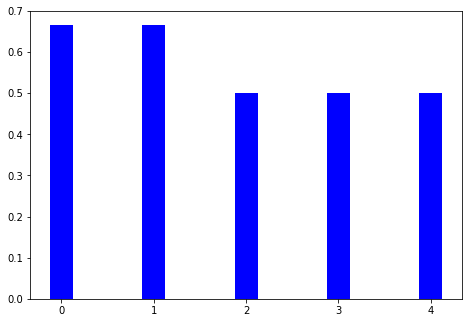

In [91]:
#cross validation score
cv_score_entropy = cross_val_score(decTree_entropy, X_train, Y_train, cv=5)
cv_score_gini = cross_val_score(deciTree_gini, X_train, Y_train, cv=5)

print("cross validation score for entropy")
print(cv_score_entropy*100)

print("Accuracy = ",cv_score_entropy.mean()*100)
print("Standard Deviation = ",cv_score_entropy.std())

X_plot = np.arange(5)
fig_v = plt.figure()
ax_v = fig_v.add_axes([0,0,1,1])
ax_v.bar(X_plot + 0.00,cv_score_entropy, color = 'b', width = 0.25)
plt.show()

cross validation score for gini
[66.66666667 66.66666667 50.         50.         50.        ]
Accuracy =  56.666666666666664
Standard Deviation =  0.08164965809277258


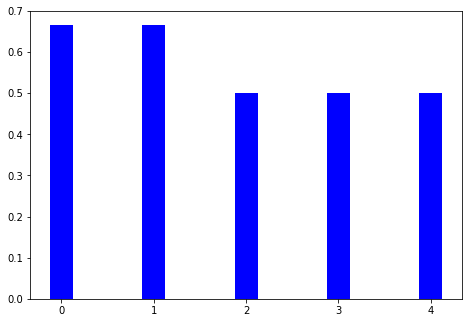

In [92]:
print("cross validation score for gini")
print(cv_score_gini*100)

print("Accuracy = ",cv_score_gini.mean()*100)
print("Standard Deviation = ",cv_score_gini.std())

X_plot = np.arange(5)
fig_v = plt.figure()
ax_v = fig_v.add_axes([0,0,1,1])
ax_v.bar(X_plot + 0.00,cv_score_gini, color = 'b', width = 0.25)
plt.show()

Print the depth of the decison Tree

In [93]:
#depth of decision tree based on entropy
print("Depth of entropy based decision tree classifier:",decTree_entropy.get_depth())
#depth of tree based on gini impurity
print("Depth of gini impurity based decision tree classifier:",deciTree_gini.get_depth())

Depth of entropy based decision tree classifier: 4
Depth of gini impurity based decision tree classifier: 4


Print the number of leaves in the decision Tree

In [94]:
#no of leaves of entropy decision tree
print("No of leaves of entropy based decision tree classifier:",decTree_entropy.get_n_leaves())
#no of leaves of gini impurity decision tree
print("No of leaves of gini impurity based decision tree classifier:",deciTree_gini.get_n_leaves())

No of leaves of entropy based decision tree classifier: 7
No of leaves of gini impurity based decision tree classifier: 7


Return the index of the leaf that each sample is predicted as.



In [95]:
print("Array Index of leaf that each sample is predicted of entropy based decision tree classifier:-->",decTree_entropy.apply(X))
print("Array Index of leaf that each sample is predicted of gini impurity based decision tree classifier:-->",deciTree_gini.apply(X))

Array Index of leaf that each sample is predicted of entropy based decision tree classifier:--> [ 9  1  9  1  1  7 12  7 12  6 12 11  5  1]
Array Index of leaf that each sample is predicted of gini impurity based decision tree classifier:--> [ 7  1  6  1  1  9  6  9 12  7 12 11  5  1]


Print the decision path

In [96]:
decpath_entropy = decTree_entropy.decision_path(X_test,check_input=True)
decpath_gini = decTree_entropy.decision_path(X_test,check_input=True)
print("The decision path for the Entropy based classifier")
print(decpath_entropy)
print("")
print("")
print("The decision path for the Gini impurity based classifier")
print(decpath_gini)

The decision path for the Entropy based classifier
  (0, 0)	1
  (0, 2)	1
  (0, 8)	1
  (0, 10)	1
  (0, 12)	1
  (1, 0)	1
  (1, 2)	1
  (1, 8)	1
  (1, 10)	1
  (1, 12)	1


The decision path for the Gini impurity based classifier
  (0, 0)	1
  (0, 2)	1
  (0, 8)	1
  (0, 10)	1
  (0, 12)	1
  (1, 0)	1
  (1, 2)	1
  (1, 8)	1
  (1, 10)	1
  (1, 12)	1


Print the gini impurity of each feature

In [97]:
gini_impurity1 = decTree_entropy.feature_importances_
print("Gini Impurity of each features of Decision Tree Classifier with Entropy")
for i,v in enumerate(gini_impurity1):
	print('Feature: %0d, Score: %.5f' % (i,v))
print(" ")
print("Gini Impurity of each features of Decision Tree Classifier with Gini")
gini_impurity2 = deciTree_gini.feature_importances_
for i,v in enumerate(gini_impurity2):
	print('Feature: %0d, Score: %.5f' % (i,v))
print("")
print("")
print("the gini impurity of feature nodewise:")
print("ENTROPY MODEL")
print("--------------")
print(decTree_entropy.tree_.impurity)

print("GINI  MODEL")
print("--------------")
print(deciTree_gini.tree_.impurity)

Gini Impurity of each features of Decision Tree Classifier with Entropy
Feature: 0, Score: 0.45551
Feature: 1, Score: 0.29449
Feature: 2, Score: 0.11299
Feature: 3, Score: 0.13701
 
Gini Impurity of each features of Decision Tree Classifier with Gini
Feature: 0, Score: 0.34375
Feature: 1, Score: 0.18750
Feature: 2, Score: 0.18750
Feature: 3, Score: 0.28125


the gini impurity of feature nodewise:
ENTROPY MODEL
--------------
[0.91829583 0.         1.         0.81127812 1.         0.
 0.         0.         0.81127812 0.         1.         0.
 0.        ]
GINI  MODEL
--------------
[0.44444444 0.         0.5        0.375      0.5        0.
 0.         0.         0.375      0.         0.5        0.
 0.        ]


Training accuracy

In [98]:
#training accuracy for entropy based
print("The training accuracy of entropy based classifier:-->",decTree_entropy.score(X_train,Y_train))
#training accuracy for gini impurity based
print("The training accuracy of gini impurity based classifier:-->",deciTree_gini.score(X_train,Y_train))

The training accuracy of entropy based classifier:--> 1.0
The training accuracy of gini impurity based classifier:--> 1.0


Testing accuracy

In [99]:
#testing accuracy for entropy based
print("The testing accuracy of entropy based classifier:-->",decTree_entropy.score(X_test,Y_test))
#testing accuracy for giniimpurity based
print("The testing accuracy of gini impurity based classifier:-->",deciTree_gini.score(X_test,Y_test))

The testing accuracy of entropy based classifier:--> 0.5
The testing accuracy of gini impurity based classifier:--> 0.5


Map the query: [Time: Morning, Temperature: Warm, Friend_Attending: No, 'Wind': Low] to the correct numerical value as the training and the predict the output.

In [100]:
#2- Morning , 2- Warm, 0-No, 1 - Low
query = pd.DataFrame([[2,2,0,1]],columns= ['Time','Temperature','Friend_Attending','Windy'])

print("Prediction for the entropy based classifier:",decTree_entropy.predict(query))
print("Prediction for the entropy based classifier:",deciTree_gini.predict(query))

Prediction for the entropy based classifier: [1.]
Prediction for the entropy based classifier: [1.]


<font color='red'>**Part 3**</font>

Plot the decision tree

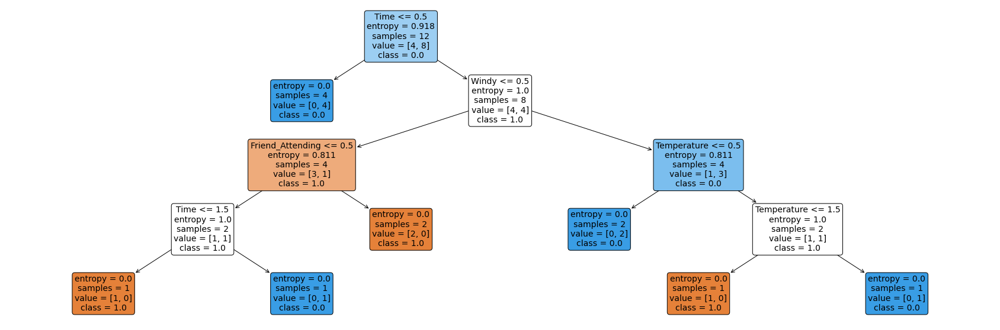

In [101]:
#decision tree for entropy based classifier
plt.figure(figsize=(30,10))
a = tree.plot_tree(decTree_entropy,
                   #use the feature names stored
                   feature_names = [str(x) for x in features],
                   #use the class names stored
                   class_names = [str(x) for x in labels],
                   rounded = True,
                   filled = True,
                   fontsize=14)
#show the plot
plt.show()

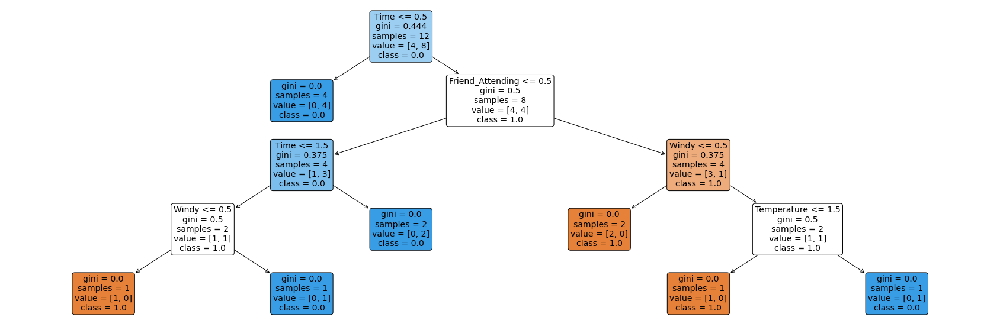

In [102]:
#decision tree of gini impurity based classifier
plt.figure(figsize=(30,10))
a = tree.plot_tree(deciTree_gini,
                   #use the feature names stored
                   feature_names = [str(x) for x in features],
                   #use the class names stored
                   class_names = [str(x) for x in labels],
                   rounded = True,
                   filled = True,
                   fontsize=14)
#show the plot
plt.show()

Plot the decision surface

No handles with labels found to put in legend.


(-1.0, 1.9800000000000026, -1.0, 1.9800000000000026)

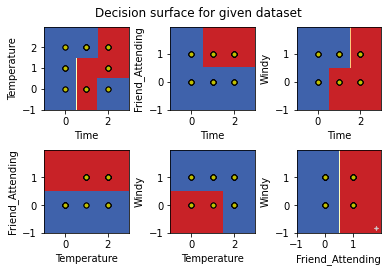

In [103]:
#from matplotlib import pyplot
#pyplot.scatter(X['Friend_Attending'],Y)
# Parameters
n_classes = 2
plot_colors = "ryb"
plot_step = 0.02

# Load data
iris = load_iris()

for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    # We only take the two corresponding features
    X_surface = X.loc[:, [features[pair[0]], features[pair[1]]]]
    y_surface = Y
  
    # Train
    model = tree.DecisionTreeClassifier().fit(X_surface, y_surface)
  
    # Plot the decision boundary
    plt.subplot(2, 3, pairidx + 1)

    x_min, x_max = X_surface.iloc[:, 0].min() - 1, X_surface.iloc[:, 0].max() + 1
    y_min, y_max = X_surface.iloc[:, 1].min() - 1, X_surface.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)

    plt.xlabel(features[pair[0]])
    plt.ylabel(features[pair[1]])

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = X.where(Y == i)
        plt.scatter(X_surface.iloc[list(idx.index.values), 0], X_surface.iloc[list(idx.index.values), 1], c=color,
                    cmap='Greys', edgecolor='black', s=25)

plt.suptitle("Decision surface for given dataset\n")
plt.legend(loc='lower right', borderpad=0, handletextpad=0,labels=None)
plt.axis("tight")

#plt.figure()
#clf=DecisionTreeClassifier().fit(X,Y)
#plot_tree(clf,filled=True)
#plt.show

In [104]:
#pyplot.scatter(X['Temperature'],Y)

<font color='magenta'>**Part 04: Not Compulsory**</font>

Advanced: Can you implement the partitioning of the decision tree using the following algorithm

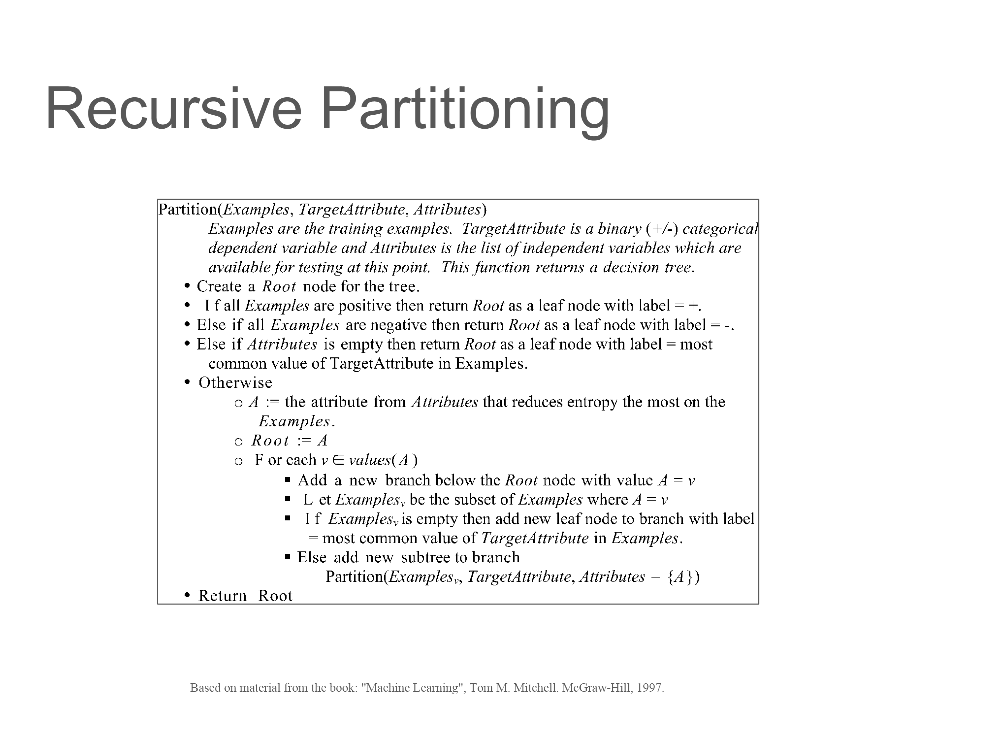

Part 5: Building Decision Trees when the data is of a continuous nature

In the previous case the nodes were broken based on entropy/gini impurity. In the case of regression the mean sqaured error is the decsion parameter for splitting the nodes. The following dataset contains continuous data and we need to use decision trees with regression.

Read the dataset

In [105]:
#reading the data and also filling missing values
import pandas as pd

data = pd.read_csv("death.csv", na_values=["*", "**"]) #na_values used for checking missing values

data

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent Trend (2),Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,No,46.0,45.9,46.1,"1,57,376",falling,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,No,125.6,108.9,144.2,43,stable,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,No,125.3,100.2,155.1,18,stable,1.7,0.0,3.4
3,"North Slope Borough, Alaska",2185,No,124.9,73.0,194.7,5,NaN,NaN,NaN,NaN
4,"Owsley County, Kentucky",21189,No,118.5,83.1,165.5,8,stable,2.2,-0.4,4.8
...,...,...,...,...,...,...,...,...,...,...,...
3136,"Yakutat City and Borough, Alaska<sup>3</sup>",2282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3137,"Yukon-Koyukuk Census Area, Alaska",2290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3138,"Zapata County, Texas",48505,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3139,"Zavala County, Texas",48507,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Preprocess the dataset to remove all the rows with empty column values

In [106]:
#removing all the rows with empty column values
df1 = data.dropna()
df1

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent Trend (2),Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,No,46.0,45.9,46.1,"1,57,376",falling,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,No,125.6,108.9,144.2,43,stable,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,No,125.3,100.2,155.1,18,stable,1.7,0.0,3.4
4,"Owsley County, Kentucky",21189,No,118.5,83.1,165.5,8,stable,2.2,-0.4,4.8
5,"Union County, Florida",12125,No,113.5,89.9,141.4,19,falling,-2.2,-4.3,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2807,"Los Alamos County, New Mexico",35028,Yes,15.8,9.4,25.4,4,stable,-2.9,-5.8,0.0
2808,"Eagle County, Colorado",8037,Yes,14.9,8.7,23.6,5,falling,-4.9,-9.3,-0.3
2810,"Utah County, Utah",49049,Yes,12.4,10.7,14.4,37,falling,-2.8,-3.9,-1.8
2811,"McKinley County, New Mexico",35031,Yes,11.6,8.0,16.2,7,falling,-3.2,-5.7,-0.7


Convert Categorical Values to numerical

In [107]:
#encoding categorical to numerical features
#converting yes/no to 0/1 format and recent trend(2) having more than two categorical types hence using one hot encoding dummies method
values = {"Met Objective of 45.5? (1)":{"Yes": 1, "No": 0}}
#df["Met Objective of 45.5? (1)"]=df["Met Objective of 45.5? (1)"].replace({"Yes":1})
#df["Met Objective of 45.5? (1)"]=df["Met Objective of 45.5? (1)"].replace({"No":0})
converted_df1 = pd.get_dummies(df1, columns=["Recent Trend (2)"])
converted_df1 = converted_df1.replace(values)
converted_df1

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend,Recent Trend (2)_falling,Recent Trend (2)_rising,Recent Trend (2)_stable
0,United States,0,0,46.0,45.9,46.1,"1,57,376",-2.4,-2.6,-2.2,1,0,0
1,"Perry County, Kentucky",21193,0,125.6,108.9,144.2,43,-0.6,-2.7,1.6,0,0,1
2,"Powell County, Kentucky",21197,0,125.3,100.2,155.1,18,1.7,0.0,3.4,0,0,1
4,"Owsley County, Kentucky",21189,0,118.5,83.1,165.5,8,2.2,-0.4,4.8,0,0,1
5,"Union County, Florida",12125,0,113.5,89.9,141.4,19,-2.2,-4.3,0.0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2807,"Los Alamos County, New Mexico",35028,1,15.8,9.4,25.4,4,-2.9,-5.8,0.0,0,0,1
2808,"Eagle County, Colorado",8037,1,14.9,8.7,23.6,5,-4.9,-9.3,-0.3,1,0,0
2810,"Utah County, Utah",49049,1,12.4,10.7,14.4,37,-2.8,-3.9,-1.8,1,0,0
2811,"McKinley County, New Mexico",35031,1,11.6,8.0,16.2,7,-3.2,-5.7,-0.7,1,0,0


In [108]:
# furthermore in one of column named "AVERAGE DEATHS PER YEAR" numbers are in string form like 1,57,376 which cannot be directly converted into float form so we need to fix it

for index in converted_df1.index:
  converted_df1.at[index,'Average Deaths per Year']  = converted_df1.at[index,'Average Deaths per Year'].replace(",","")
converted_df1

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend,Recent Trend (2)_falling,Recent Trend (2)_rising,Recent Trend (2)_stable
0,United States,0,0,46.0,45.9,46.1,157376,-2.4,-2.6,-2.2,1,0,0
1,"Perry County, Kentucky",21193,0,125.6,108.9,144.2,43,-0.6,-2.7,1.6,0,0,1
2,"Powell County, Kentucky",21197,0,125.3,100.2,155.1,18,1.7,0.0,3.4,0,0,1
4,"Owsley County, Kentucky",21189,0,118.5,83.1,165.5,8,2.2,-0.4,4.8,0,0,1
5,"Union County, Florida",12125,0,113.5,89.9,141.4,19,-2.2,-4.3,0.0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2807,"Los Alamos County, New Mexico",35028,1,15.8,9.4,25.4,4,-2.9,-5.8,0.0,0,0,1
2808,"Eagle County, Colorado",8037,1,14.9,8.7,23.6,5,-4.9,-9.3,-0.3,1,0,0
2810,"Utah County, Utah",49049,1,12.4,10.7,14.4,37,-2.8,-3.9,-1.8,1,0,0
2811,"McKinley County, New Mexico",35031,1,11.6,8.0,16.2,7,-3.2,-5.7,-0.7,1,0,0


Split the dataset into train and test(Based on split size)

In [109]:
#before splitting we need to divide the dataset into target and independent variables
X_1 = converted_df1.drop(['Upper 95% Confidence Interval for Trend','County'],axis=1) #it takes all features except target
Y_1 = converted_df1['Upper 95% Confidence Interval for Trend'] #It takes target variable

#oe = OrdinalEncoder()
#X_1["County"] = oe.fit_transform(X_1[["County"]])
print("INDEPENDENT VARIABLES (X_1)")
print("--------------------------")
X_1

INDEPENDENT VARIABLES (X_1)
--------------------------


,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Recent Trend (2)_falling,Recent Trend (2)_rising,Recent Trend (2)_stable
0,0,0,46.0,45.9,46.1,157376,-2.4,-2.6,1,0,0
1,21193,0,125.6,108.9,144.2,43,-0.6,-2.7,0,0,1
2,21197,0,125.3,100.2,155.1,18,1.7,0.0,0,0,1
4,21189,0,118.5,83.1,165.5,8,2.2,-0.4,0,0,1
5,12125,0,113.5,89.9,141.4,19,-2.2,-4.3,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2807,35028,1,15.8,9.4,25.4,4,-2.9,-5.8,0,0,1
2808,8037,1,14.9,8.7,23.6,5,-4.9,-9.3,1,0,0
2810,49049,1,12.4,10.7,14.4,37,-2.8,-3.9,1,0,0
2811,35031,1,11.6,8.0,16.2,7,-3.2,-5.7,1,0,0


In [110]:
print("TARGET VARIABLE(Y_1)")
print("---------------------")
Y_1

TARGET VARIABLE(Y_1)
---------------------


0      -2.2
1       1.6
2       3.4
4       4.8
5       0.0
       ... 
2807    0.0
2808   -0.3
2810   -1.8
2811   -0.7
2812    1.6
Name: Upper 95% Confidence Interval for Trend, Length: 2694, dtype: float64

In [111]:
feature_names = X_1.columns
labels = Y_1.unique()
X_train_1, X_test_1, Y_train_1, Y_test_1 = train_test_split(X_1, Y_1, test_size=0.2, random_state=0)


Displaying Training dataset


In [112]:
print("TRAINING DATASET FOR INDEPENDENT VARIABLES(X_train_1)")
print("<----------------------------------------------------------------------------------------------------------------------------------------------------------------------------->")
X_train_1

TRAINING DATASET FOR INDEPENDENT VARIABLES(X_train_1)
<----------------------------------------------------------------------------------------------------------------------------------------------------------------------------->


,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Recent Trend (2)_falling,Recent Trend (2)_rising,Recent Trend (2)_stable
1916,13241,0,46.3,35.5,60.1,13,-1.3,-2.5,1,0,0
1918,26127,0,46.3,36.9,57.6,17,-1.7,-3.2,1,0,0
2708,8075,1,30.4,21.8,41.6,8,0.2,-1.7,0,0,1
785,6015,0,59.9,48.4,73.4,19,-2.3,-3.5,1,0,0
562,51071,0,64.1,50.5,80.7,16,-0.2,-1.6,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1783,53011,0,48.0,45.1,51.1,206,-1.8,-2.2,1,0,0
784,1009,0,59.9,52.0,68.6,43,-1.6,-2.5,1,0,0
859,20037,0,59.0,49.2,70.3,26,-0.3,-1.6,0,0,1
1697,12111,0,48.9,46.0,52.0,213,-1.8,-2.2,1,0,0


In [113]:
print("TRAINING DATASET FOR TARGET VARIABLE(Y_train_1)")
print("<------------------------------------------------>")
Y_train_1

TRAINING DATASET FOR TARGET VARIABLE(Y_train_1)
<------------------------------------------------>


1916   -0.1
1918   -0.2
2708    2.1
785    -1.1
562     1.2
       ... 
1783   -1.4
784    -0.6
859     0.9
1697   -1.3
2714    1.2
Name: Upper 95% Confidence Interval for Trend, Length: 2155, dtype: float64

Display Testing Data

In [114]:
print("TESTING DATASET FOR INDEPENDENT VARIABLES(X_test_1)")
print("<----------------------------------------------------------------------------------------------------------------------------------------------------------------------------->")
X_test_1

TESTING DATASET FOR INDEPENDENT VARIABLES(X_test_1)
<----------------------------------------------------------------------------------------------------------------------------------------------------------------------------->


,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Recent Trend (2)_falling,Recent Trend (2)_rising,Recent Trend (2)_stable
358,12059,0,68.6,55.1,84.7,18,-0.1,-1.6,0,0,1
1319,39049,0,53.5,51.5,55.6,553,-3.3,-4.4,1,0,0
892,40065,0,58.6,46.6,72.9,17,-6.3,-14.5,0,0,1
1911,51025,0,46.5,35.1,60.8,11,-1.6,-3.2,1,0,0
364,21087,0,68.4,51.0,90.4,11,0.6,-1.1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1800,34029,0,47.7,45.7,49.8,442,-4.3,-7.1,1,0,0
242,5085,0,72.3,63.3,82.2,49,0.1,-0.9,0,0,1
2308,16035,1,40.7,27.4,60.3,6,-1.5,-3.7,0,0,1
688,21039,0,61.5,38.8,94.6,5,1.1,-1.8,0,0,1


In [115]:
print("TESTING DATASET FOR TARGET VARIABLE(Y_test_1)")
print("<------------------------------------------------>")
Y_test_1

TESTING DATASET FOR TARGET VARIABLE(Y_test_1)
<------------------------------------------------>


358     1.4
1319   -2.1
892     2.7
1911    0.0
364     2.4
       ... 
1800   -1.5
242     1.2
2308    0.8
688     4.0
1644    1.1
Name: Upper 95% Confidence Interval for Trend, Length: 539, dtype: float64

Perform the decision tree regression

In [116]:
regressor_model = DecisionTreeRegressor()
regressor_model.fit(X_train_1, Y_train_1)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

Facts about the regression model


In [117]:
print('Depth of Decision Tree Regressor = ', regressor_model.get_depth())
print('Number of Leave Nodes in Decision Tree Regressor = ',regressor_model.get_n_leaves())
print(" ")
result = regressor_model.feature_importances_
print("Gini Impurity of each features of Decision Tree Regressor")
for i,v in enumerate(result):
	print('Feature: %0d, Score: %.5f' % (i,v))

Depth of Decision Tree Regressor =  25
Number of Leave Nodes in Decision Tree Regressor =  1381
 
Gini Impurity of each features of Decision Tree Regressor
Feature: 0, Score: 0.00118
Feature: 1, Score: 0.00007
Feature: 2, Score: 0.00673
Feature: 3, Score: 0.06853
Feature: 4, Score: 0.00175
Feature: 5, Score: 0.01344
Feature: 6, Score: 0.73534
Feature: 7, Score: 0.04528
Feature: 8, Score: 0.12761
Feature: 9, Score: 0.00006
Feature: 10, Score: 0.00001


Print the cross validation score with folds = 5



CROSS VALIDATION SCORE FOR REGRESSION:
[0.70204677 0.89808976 0.90542373 0.678543   0.854285  ]
Accuracy =  80.76776522961194
Standard Deviation =  0.09770826922073685


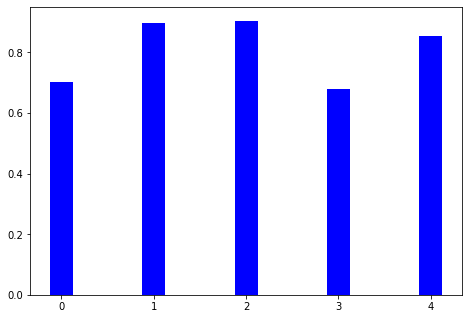

In [126]:
#cross validation score
cv_score_regression = cross_val_score(regressor_model, X_train_1, Y_train_1, cv=5)
print("CROSS VALIDATION SCORE FOR REGRESSION:" )
print(cv_score_regression)
print("Accuracy = ",cv_score_regression.mean()*100)
print("Standard Deviation = ",cv_score_regression.std())

X_plot = np.arange(5)
fig_v = plt.figure()
ax_v = fig_v.add_axes([0,0,1,1])
ax_v.bar(X_plot + 0.00,cv_score_regression, color = 'b', width = 0.25)
plt.show()

Predict on test dataset

In [119]:
Y_pred_1 = regressor_model.predict(X_test_1)
#predicted value of Y_1
print("THE PREDICTED VALUE OF TEST DATASET:")
print("------------------------------------")
Y_pred_1

THE PREDICTED VALUE OF TEST DATASET:
------------------------------------


array([ 1.5, -1.6,  0.7, -0.2,  2.6,  1.7, -1.1, -0.7,  0.8,  1.4,  1.6,
        1.6,  2.2, -1.6, -1.1,  1.6,  2.8,  1.2,  2.8, -0.8,  0.2,  0.9,
        0.7, -0.4,  1.9,  2.6,  2.4,  1.2,  0.8, -1.4, -0.7,  1.1, -0.3,
        3.6, -1.5,  2. ,  0.4,  0.7,  0.7, -0.4,  3.1, -0.2,  0.9, -1.1,
        0.8,  0.3,  1.1,  2.3,  1.7, -0.7,  2. , -1.3, -0.8, -0.4,  0. ,
        0.4, -1.4, -1. ,  2.6,  2. ,  0.4,  3.4,  0.2, -0.5, -0.4,  0.1,
        0.4, -0.6,  0.2,  0.9, -0.9,  0.3,  0.5, -0.3, -1.2,  1.5,  0.2,
        1.3,  0.5,  1.3,  2.8, -0.6, -0.6,  0.3, -1.4,  0.2, -0.3,  0.3,
       -1.4,  0. ,  1.5, -1.6,  0.5,  1.3, -0.4,  2.3,  2.5,  1.7,  3.3,
        1.7,  3. ,  1.5,  5.5,  1.5,  3. ,  0.4,  1.2, -0.7, -0.7, -0.2,
        1.4,  0.7,  0.4,  0.8,  1.4, -0.2, -1.1, -8.1,  2.6, -1. ,  1.8,
       -0.7,  0.2,  0.8,  1.8,  1.4,  0.1, -0.9,  0.8,  1. ,  0.5,  4.1,
        0.5, -1. ,  3.5,  3.1,  1.8,  2.7, -2. ,  0.4, -0.9,  0.8,  2.2,
        0.1,  1.4,  0.1,  0.1, -0.6,  0.1,  1.2, -1

In [120]:
#tested value of Y_1
print("THE GIVEN VALUE OF DATASET:")
print("--------------------------")
Y_test_1.to_xarray()

THE GIVEN VALUE OF DATASET:
--------------------------


<xarray.DataArray 'Upper 95% Confidence Interval for Trend' (index: 539)>
array([ 1.4, -2.1,  2.7,  0. ,  2.4,  1.9, -1.4, -0.9,  0.7,  1.4,  1.6,
        1.6,  0.4, -1.6, -1.2,  1.6,  2.7,  1.3,  3.3, -0.9,  0.1,  0.7,
        0.6, -0.3,  1.8,  2.7,  2.6,  1.3,  1. , -1.1, -0.5,  1. , -0.3,
        3.5, -1.6,  1.9,  0.8,  0.8,  0.6, -0.7,  2.7, -0.6,  0.8, -0.9,
        0.8,  0.3,  1. ,  2.2,  1.8, -0.8,  2.2, -1.7, -0.6, -0.4,  0.8,
        0.5, -1.4, -2.9,  2.3,  2. ,  0.2,  3.1,  0.3, -0.4, -0.6,  0.3,
        0.2,  0. ,  0.2,  0.7, -1.9,  0.3,  0.2, -0.3, -0.2,  1.3,  0.4,
        1.4,  0.7,  1.3,  2.6, -1.4, -0.6,  0.5, -0.7,  0.5, -0.3,  0. ,
       -1.3, -0.2,  1.3, -2.1,  0.3,  1.3, -0.6,  2.3,  2.5,  1.9,  3.3,
        1.9,  2.8,  1.3,  4.4,  1.3,  2.8,  0.3,  1. , -0.7, -0.6, -0.3,
        1.4,  0.7,  0.4,  0.9,  0.2, -0.2, -0.8, -4.6,  2.2, -1. ,  1.7,
       -0.8,  0.3,  0.9,  1.5,  1.3,  0.3, -0.9,  0.9,  1.1,  0.6,  4.1,
        0.2, -1.5,  3.6,  2.7,  1.7,  3.1, -1.8,  0.6, -1.2,  1.2,  2.2,
        0.1,  1.4,  0.1,  0.1, -0.9,  0. ,  1.1, -1. ,  3.2,  0.4,  2. ,
        1.7,  0.3,  0.9,  3.2,  0. ,  0.1,  1.6,  0.2, -0.9, -1.6,  0.4,
        1.6,  0.6,  1.2,  1.1,  0.9, -0.8,  1. ,  1.4,  7.3,  2.3, -1. ,
       -0.5,  0.3, -0.5,  0.6, -0.6, -1.3, -1. ,  1.4, -0.1,  2.3,  3.2,
        0.9, -1.7,  0.9,  2.6,  2.2, -0.6,  0.7,  3.9,  2.6,  0.7,  0. ,
        2.4, -1.5,  3. ,  0.1,  2.7, -1.5,  1.5,  3.6, -0.8,  0.5,  2.1,
       -1.9, -0.3,  1.3,  1.8,  0.9,  0.6, -0.3,  0.8, -1.2, -2.4,  0.6,
        0.5,  0.8,  1.2,  0.5,  1.9,  3.2,  2.8,  0.4,  0.5,  0.6,  1. ,
        1.3,  6.2, -0.5,  1.7,  0.4,  3. , -0.1,  0.3, -2.1,  0.1, -1.2,
        1.2,  0.6, -1.3, -0.5, -0.5,  0.5, -0.6, -0.3, -1. , -0.9,  0.1,
        1. , -0.2,  0.3, -1. ,  0.1, -0.2,  0. ,  4.1,  0.5,  4.2,  0.5,
       -0.2,  1. ,  4.6, -1. ,  2.1,  0.8, -1.5, -0.9,  1.3,  3. , -1. ,
       -1. ,  0.1,  0.4, -0.7, -0.4,  0.5,  1.6,  2.5, -0.3,  0.3,  1.7,
        2.9,  0.5,  1.1,  2.1,  0.6, -0.9,  3.7, -0.1,  0.5,  0.1,  1.4,
       -0.2,  2.6,  0. ,  0.5,  0.3, -1.9,  0.6, -1.6, -1.6, -1.1,  1.5,
        0.6, -0.2,  1.4,  1.3,  1.6,  0.1,  0. ,  1.4,  0.9,  2.8, -1.4,
        1.8, -1.6, -2.1,  2.9,  0.1,  1.4,  4.3,  3.1,  3.4, -1.8, -0.7,
        2.1, -3.5,  0.4,  0.4,  0.2, -1.5, -0.8,  1.3,  3. , -1. ,  2.9,
        1.7,  0.1,  0.8,  1.7,  0. ,  1.6,  0.9, -0.4,  0.1,  1. ,  0.2,
       -1.8,  0.8,  2.3,  0.2,  0.9, 17.9,  0.4,  0. ,  1. ,  4.2, -0.2,
        0.9,  0.7,  0.4,  3.6,  0.9, -1. ,  1. ,  0.6, -1.8, -2.3, -0.1,
        1.1,  0.8,  2.2,  0.3, -0.2,  2.4,  0.9, -0.4,  0.1,  1.6, -0.3,
       -0.6, -1.1,  1. ,  0.8, -1.3,  1. ,  1.3, -0.1, -1.9, -0.1, -1.4,
        0.6, -4. , -0.2,  1. ,  1.2,  1.1,  1.8,  3.5,  1.5,  0.1, -0.8,
        1.8,  1.4, -0.5,  1.8, -1.5,  1.1,  1.4, -0.8,  1.4,  1.1,  1.2,
       -1.4,  0.4,  3. ,  0.1, -1.1, -2.7,  1.3,  1.3, -0.2,  0.4,  1. ,
        2.4,  3. ,  0.6,  0.8,  1.7,  1.2,  2.7,  0.6, -0.4,  5.5, -0.9,
        0.3,  0.2, -0.8,  0.7,  0.9,  1.1,  2. ,  3.2,  1. ,  0. ,  2. ,
       -0.8,  2.2,  1.5, -0.6, -0.7,  1.2, -1.2,  0.5,  0.9, -0.8, -0.3,
        1.6,  1.6, -0.9,  1. , -0.4,  1. , -1.9, -0.4, -0.2,  2.2,  0.2,
        0.7,  1.2, -0.5, -2.2,  4. ,  0.4, -1.5,  0.5, -0.3,  0.6,  4.8,
       -0.1,  1.2,  0.6, -0.7,  0. , -1. ,  0.7, 18.9,  1.9,  0.2,  1.3,
        2.1,  1.2,  0.8,  0.5, -0.8, -0.3, -1.1,  2.1,  1.3,  0.9,  1.1,
       -1.5,  0.7,  1.3,  0.4,  0.6,  1. , -1.3,  0.4,  0.3,  0.7,  0.3,
        0.6,  1.5, -2.2,  1. ,  0. ,  0. , -1.1,  3.4,  3.1, -1. ,  4.2,
       -0.5, -0.6,  1.7,  3.9,  0.1,  0. , -1.5,  1.2,  0.8,  4. ,  1.1])
Coordinates:
  * index    (index) int64 358 1319 892 1911 364 165 ... 1800 242 2308 688 1644

Calculate Squared Error between predicted and real values

In [121]:
#finding squared error
from sklearn.metrics import mean_squared_error

error = mean_squared_error(Y_pred_1, Y_test_1)
print("THE MEAN_SQUARED_ERROR BETWEEEN PREDICTED AND REAL VALUES IS-->",error)

THE MEAN_SQUARED_ERROR BETWEEEN PREDICTED AND REAL VALUES IS--> 0.5801855287569572


Plot the decision tree

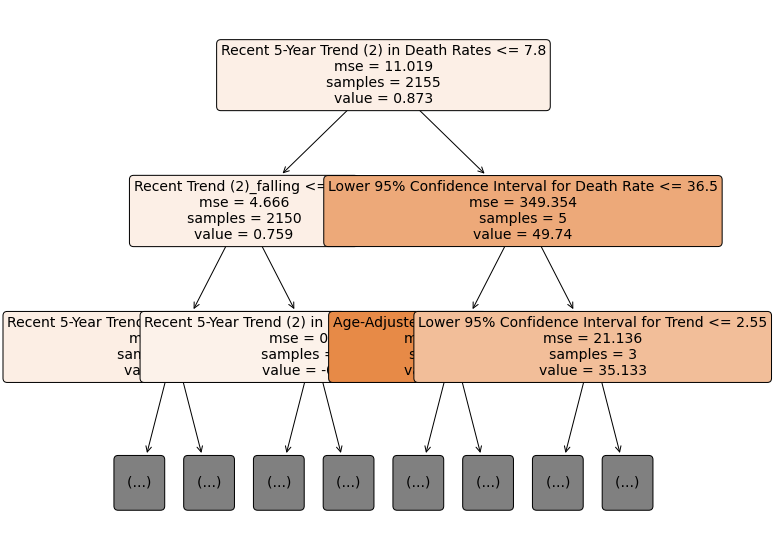

In [122]:
plt.figure(figsize=(10,10))
a = tree.plot_tree(regressor_model,
                   #use the feature names stored
                   feature_names = [str(x) for x in feature_names],
                   #use the class names stored
                   class_names = [str(x) for x in labels],
                   rounded = True,
                   filled = True,
                   fontsize=14,max_depth=2)
#show the plot
plt.show()

Gray scale decision tree

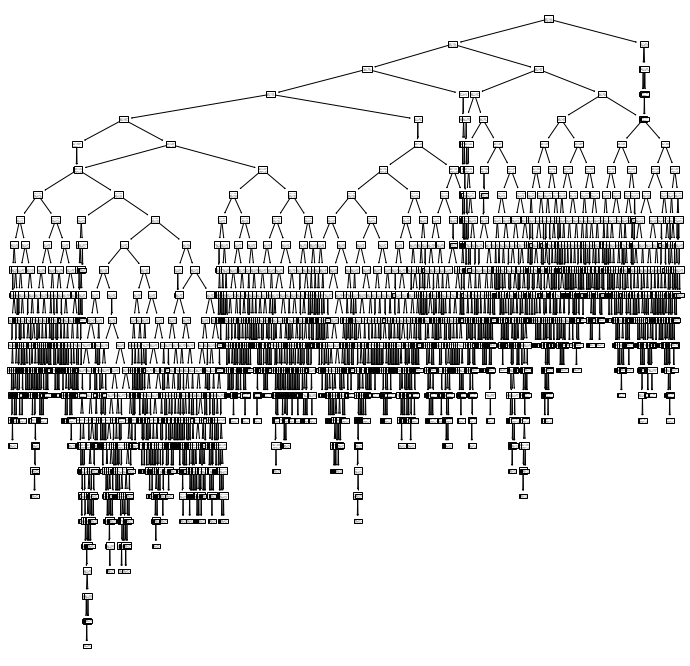

In [123]:
plt.figure(figsize=(12,12))
plot_regression = tree.plot_tree(regressor_model)
plt.show(plot_regression)

Plot the decision surface

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


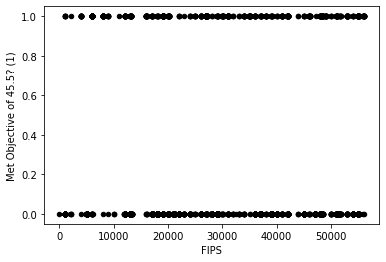

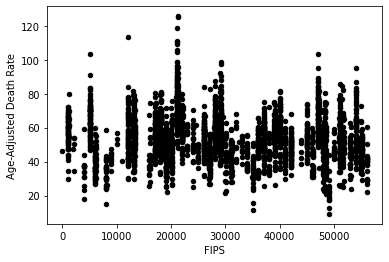

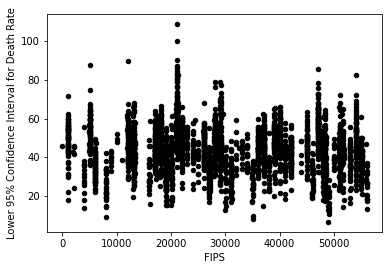

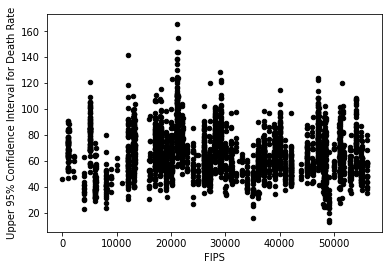

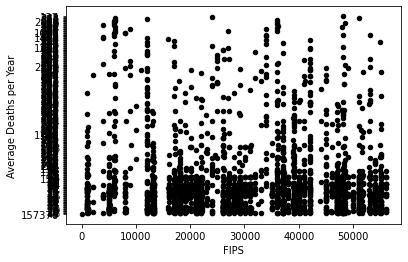

...

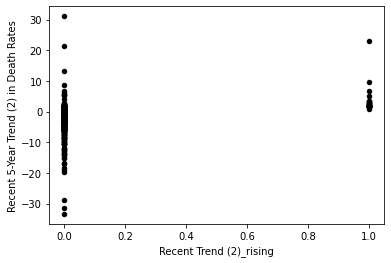

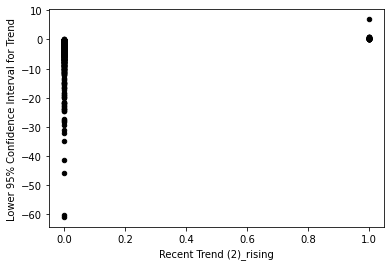

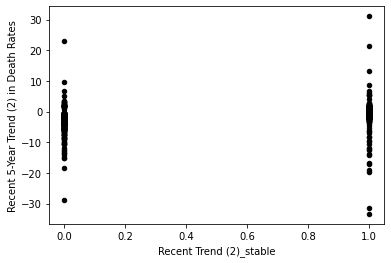

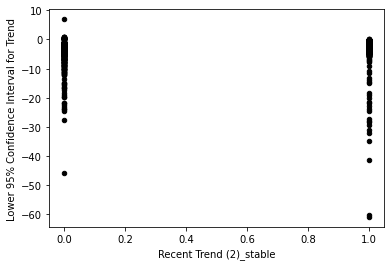

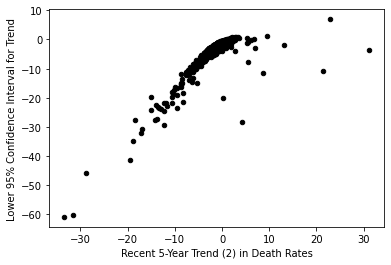

In [124]:
X_features=["FIPS","Met Objective of 45.5? (1)","Age-Adjusted Death Rate","Lower 95% Confidence Interval for Death Rate","Upper 95% Confidence Interval for Death Rate","Average Deaths per Year","Recent Trend (2)_falling","Recent Trend (2)_rising",	"Recent Trend (2)_stable","Recent 5-Year Trend (2) in Death Rates","Lower 95% Confidence Interval for Trend"]
Y_label=["Upper 95% Confidence Interval for Trend"]

for i in range(0,10):
  for j in range(i+1,11):
    ax = converted_df1.plot.scatter(x=X_features[i],y=X_features[j],c='Black')

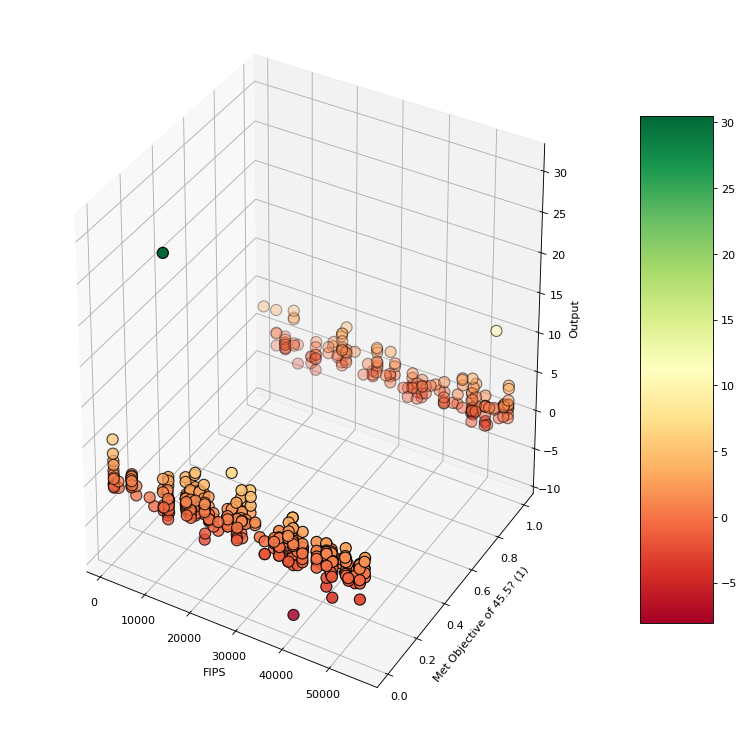

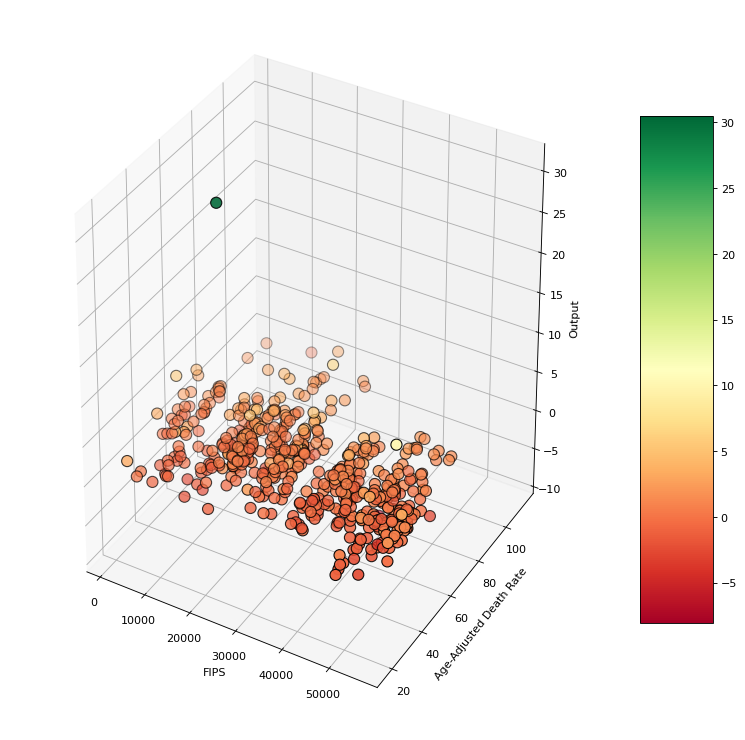

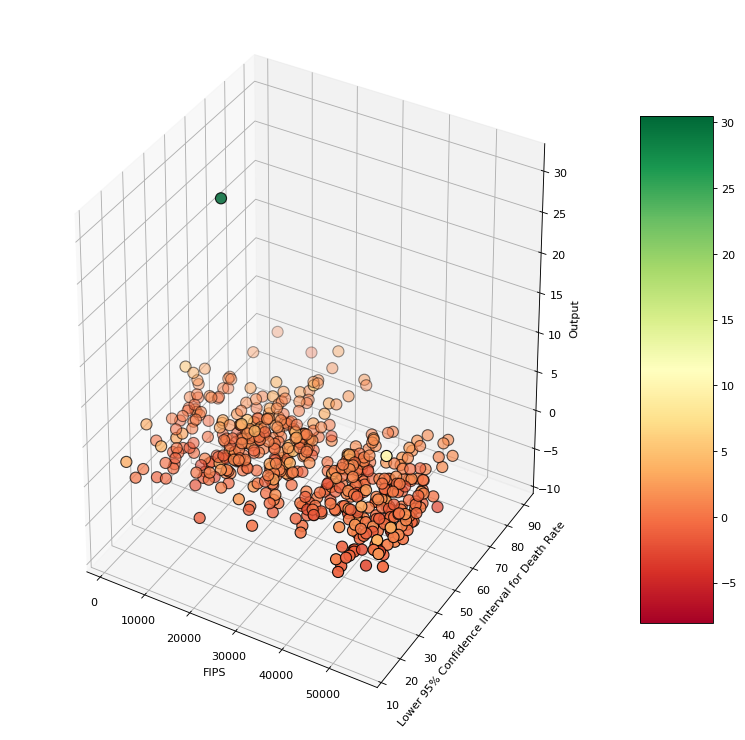

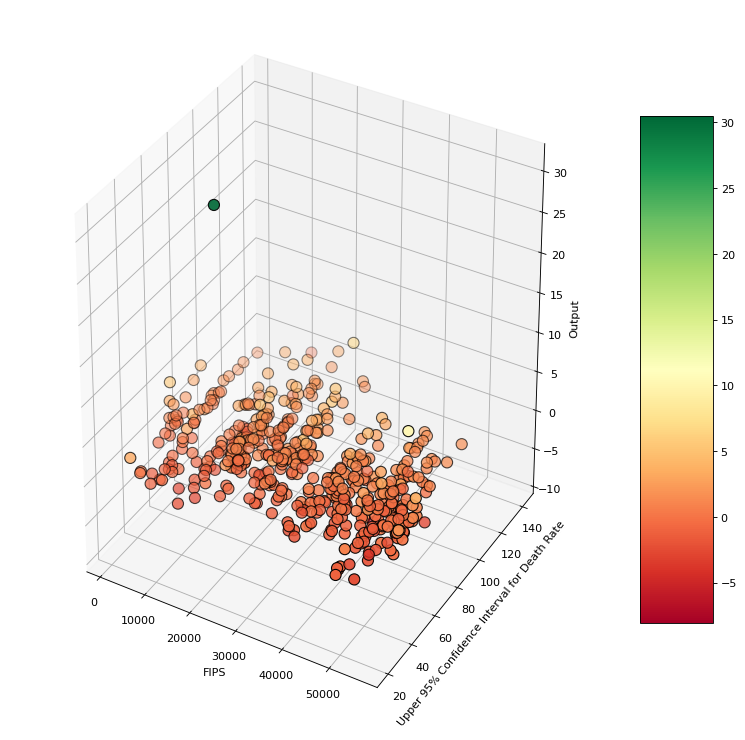

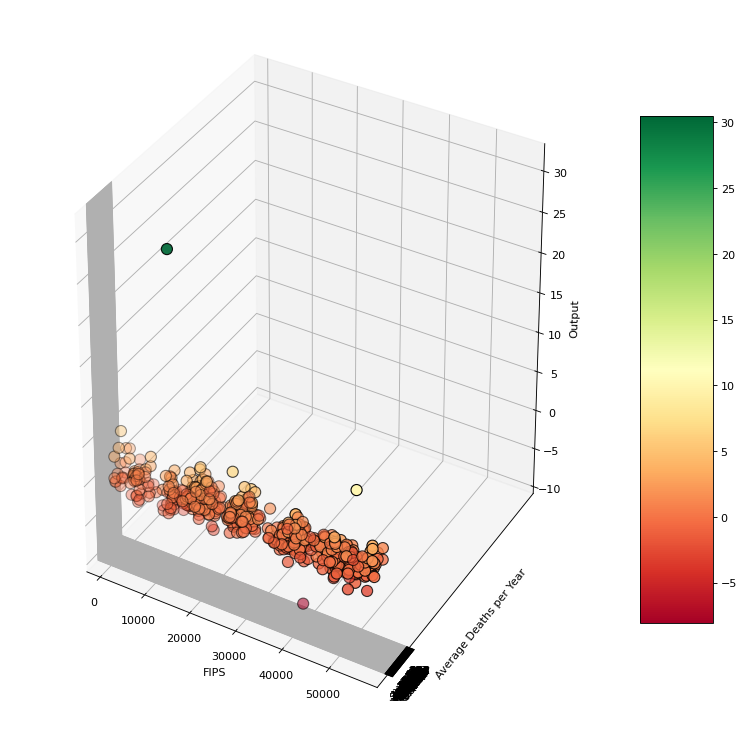

...

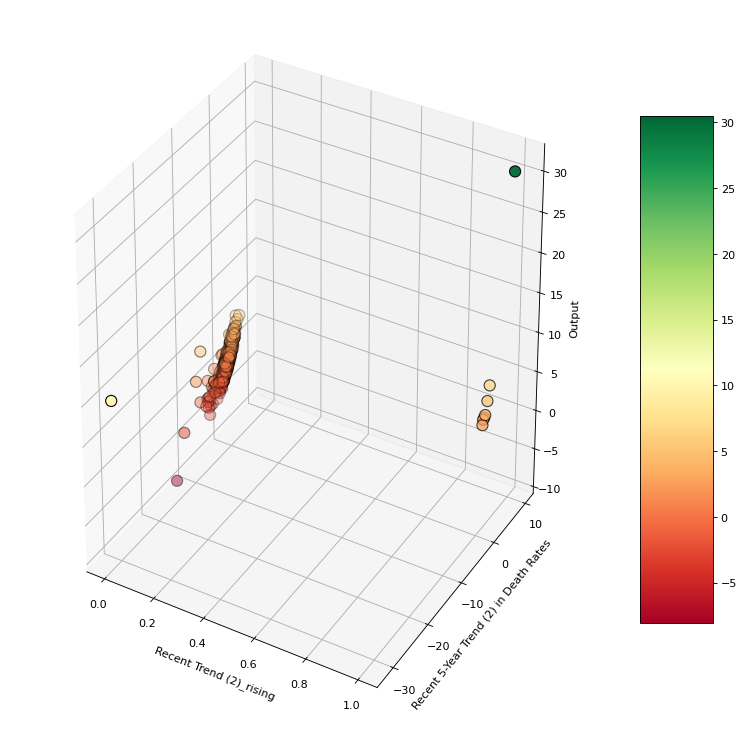

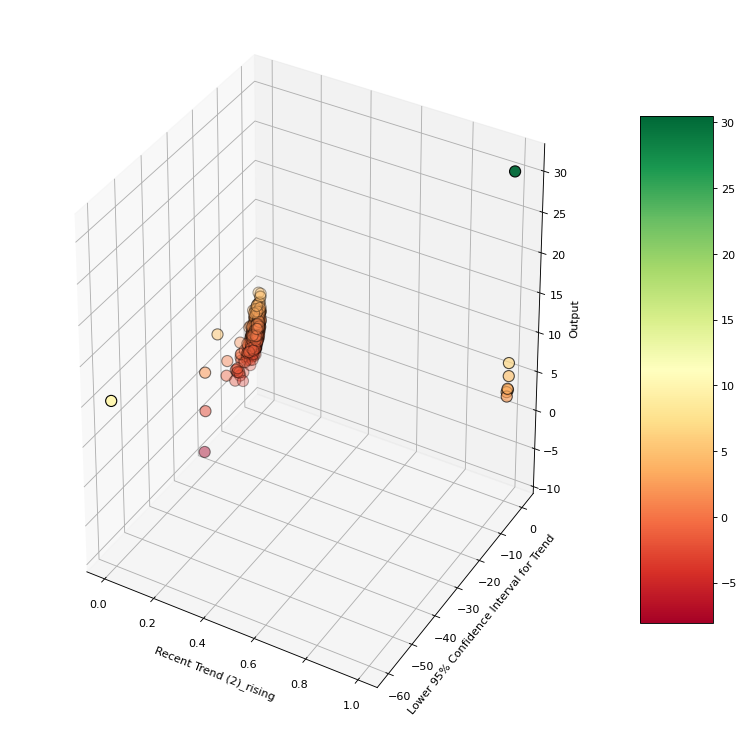

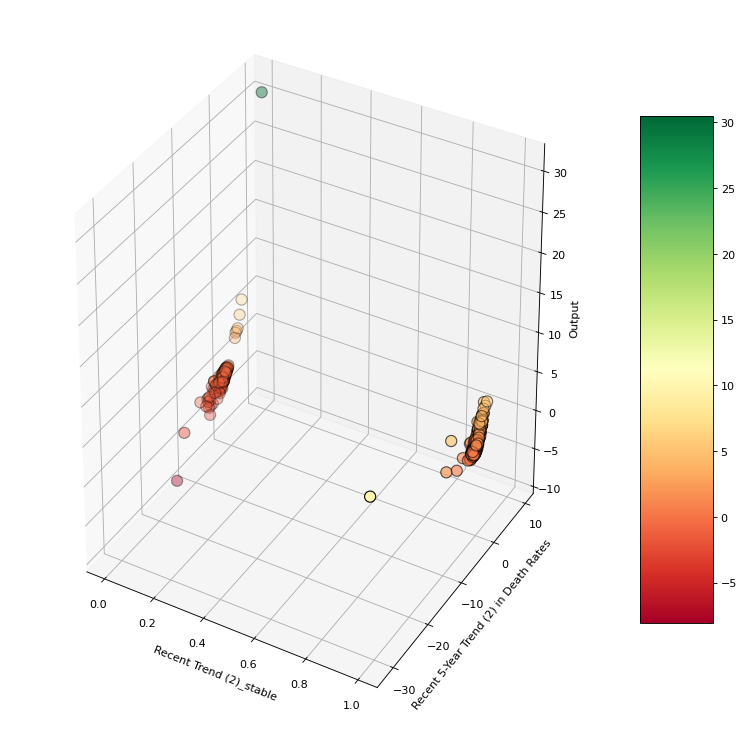

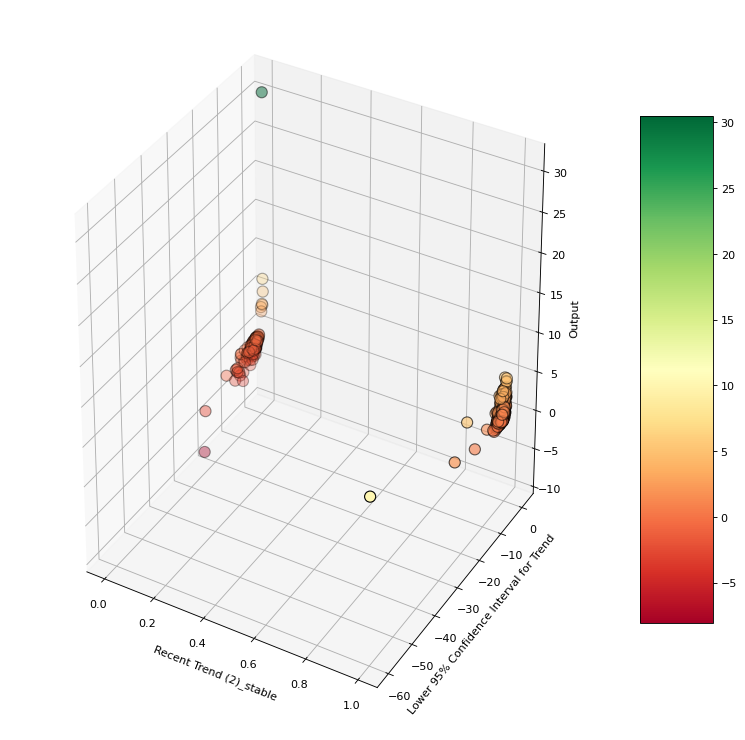

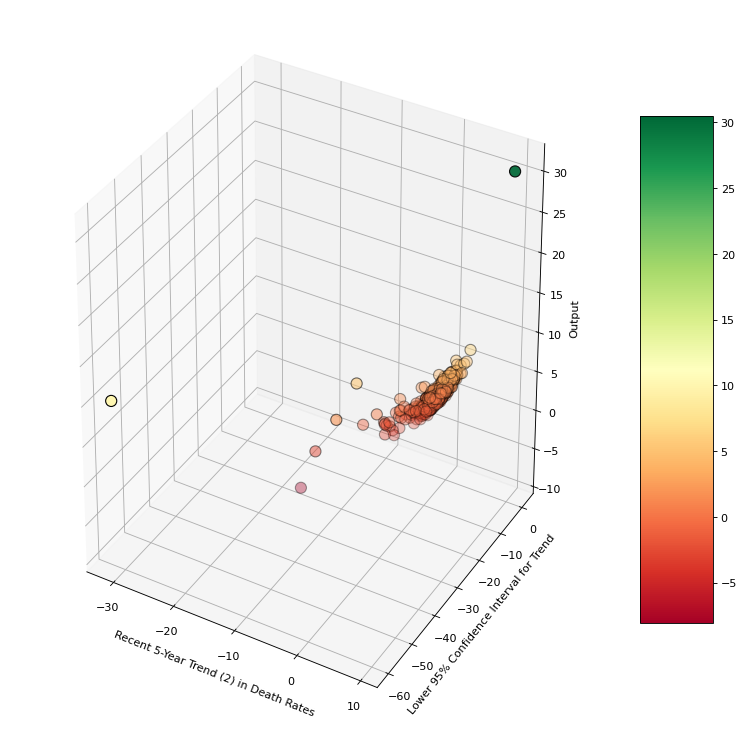

In [125]:
for i in range(0,10):
  for j in range(i+1,11):
    fig = plt.figure(figsize = (12, 12), dpi=80)
    ax = fig.add_subplot(111, projection='3d')
    pnt3d = ax.scatter3D(X_test_1[X_features[i]],X_test_1[X_features[j]],Y_pred_1, c=Y_pred_1, cmap="RdYlGn",s=100, edgecolors="black")
    fig.colorbar(pnt3d, ax = ax, shrink = 0.7, aspect = 7) 
    fig.set_facecolor('white')
    ax.set_facecolor('white')
    ax.set_xlabel(X_features[i])
    ax.set_zlabel('Output')
    ax.set_ylabel(X_features[j])
    plt.show()



<font color='green'>**References**</font>



*   [Ref1](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)

*   [Ref2](https://pbpython.com/categorical-encoding.html)


*   [Ref3](https://mljar.com/blog/visualize-decision-tree/)


*   [Ref4](https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html#sphx-glr-auto-examples-tree-plot-iris-dtc-py)


*   [Ref5](https://scikit-learn.org/stable/auto_examples/tree/plot_tree_regression.html)

*   [Ref6](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html)